# 3.6.1 Credit Card Fraud

Using this credit card fraud dataset develop an algorithm to predict fraud. Prioritize correctly finding fraud rather than correctly labeling non-fraudulent transactions.

__Data Source__: Kaggle Data Set

__Description__: The datasets contains transactions made by credit cards in September 2013 by european cardholders. This dataset presents transactions that occurred in two days, where we have 492 frauds out of 284,807 transactions. The dataset is highly unbalanced, the positive class (frauds) account for 0.172% of all transactions.

It contains only numerical input variables which are the result of a PCA transformation. Unfortunately, due to confidentiality issues, we cannot provide the original features and more background information about the data. Features V1, V2, ... V28 are the principal components obtained with PCA, the only features which have not been transformed with PCA are 'Time' and 'Amount'. Feature 'Time' contains the seconds elapsed between each transaction and the first transaction in the dataset. The feature 'Amount' is the transaction Amount, this feature can be used for example-dependant cost-senstive learning. Feature 'Class' is the response variable and it takes value 1 in case of fraud and 0 otherwise.

In [1]:
import numpy as np
current_state = np.random.get_state()
np.random.set_state(current_state)
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
import time 
from sklearn import metrics
import random
import plotly.offline as py
import plotly.graph_objs as go
py.init_notebook_mode(connected=True)

# Models
from sklearn.naive_bayes import BernoulliNB # Naive Bayes
from sklearn.neighbors import KNeighborsClassifier # KNN Classifier
from sklearn import ensemble # RandomForestClassifier(), GradientBoostingClassifier()
from sklearn import linear_model # LogisticRegression(penalty = 'l1') OLS, RidgeClassifier(), LogisticRegression(penalty = 'l2') Lasso Classifier
from sklearn import svm
from sklearn.metrics import confusion_matrix

### Data exploration

In [2]:
data_path = 'creditcard.csv'
df = pd.read_csv(data_path)
print ("Shape of data: ", df.shape)
display(df.head(5))

Shape of data:  (284807, 31)


,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


In [3]:
#Normalizing
#Check reference: https://stackoverflow.com/questions/12525722/normalize-data-in-pandas/12525836
df_norm = (df - df.min()) / (df.max() - df.min())
display(df_norm.head(1))

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,0.935192,0.76649,0.881365,0.313023,0.763439,0.267669,0.266815,0.786444,0.475312,...,0.561184,0.522992,0.663793,0.391253,0.585122,0.394557,0.418976,0.312697,0.005824,0.0


In [4]:
df_norm = (df - df.min()) / (df.max() - df.min())
# Input and outcome variables
X = df_norm[list(set(list(df_norm.columns)) - set(['Class']))]
Y = df['Class']

In [5]:
# T-test on Class groups
df_fraud = df_norm[df_norm['Class'] == 1]
df_non_fraud = df_norm[df_norm['Class'] == 0]
tvals = []
pvals = []

for col in df_norm.columns:
    tval, pval = stats.ttest_ind(df_fraud[col], df_non_fraud[col], equal_var=False)
    tvals.append(tval)
    pvals.append(pval)

# Tval, pval
df_t = pd.DataFrame()
df_t['Column'] = df_norm.columns
df_t['T-value'] = tvals
df_t['P-value'] = pvals

In [6]:
df_t.describe()

,T-value,P-value
count,31.000000,3.100000e+01
mean,inf,5.880558e-02
std,NaN,1.811971e-01
min,-36.201024,0.000000e+00
25%,-17.191130,2.393100e-75
50%,-1.965369,1.497028e-33
75%,2.999919,4.845101e-03
max,inf,8.346792e-01


In [7]:
# plotly histograms (drop down menu) and t/p values
fraud = go.Histogram(
    x=df_fraud['V10'],
    opacity=0.75,
    histnorm='probability'

)
non_fraud = go.Histogram(
    x=df_non_fraud['V10'],
    opacity=0.75,
    histnorm='probability'

)

data = [fraud, non_fraud]
layout = go.Layout(barmode='overlay')
fig = go.Figure(data=data, layout=layout)

py.iplot(fig, filename='overlaid histogram')

## Models

In [8]:
df_eval = pd.DataFrame()
evals = np.zeros(3)

# Holdout: split fraud and non_fraud
fraud_idx = list(Y[Y == 1].index)
random.shuffle(fraud_idx)

non_fraud_idx = list(set(Y.index) - set(fraud_idx))
random.shuffle(non_fraud_idx)

fraud_train_idx = fraud_idx[:int(0.7 * len(fraud_idx))]
fraud_test_idx = fraud_idx[int(0.7 * len(fraud_idx)):]

non_fraud_train_idx = non_fraud_idx[:int(0.1 * len(non_fraud_idx))]
non_fraud_test_idx = non_fraud_idx[int(0.1 * len(non_fraud_idx)):]

train_idx = fraud_train_idx + non_fraud_train_idx
test_idx = fraud_test_idx + non_fraud_test_idx

# Holdout groups

X_train = X.iloc[train_idx]
X_test = X.iloc[test_idx]
Y_train = Y.iloc[train_idx]
Y_test = Y.iloc[test_idx]

In [9]:
def evaluate(model_name, Y_pred):
    cross_tab = pd.crosstab(Y_test, Y_pred)
    # accuracy
    evals[0] = (cross_tab.iloc[0,0] + cross_tab.iloc[1,1]) / cross_tab.sum().sum()
    # recall
    evals[1] = cross_tab.iloc[1,1] / (cross_tab.iloc[1,0] + cross_tab.iloc[1,1])
    # auc score
    fpr, tpr, thresholds = metrics.roc_curve(Y_test, Y_pred, pos_label=1)
    auc = metrics.auc(fpr, tpr)
    evals[2] = auc
    df_eval[model_name] = evals

In [10]:
# Baseline: non-fraudulent
start = time.time()
base_pred = np.zeros(len(Y_test) - 1)
base_pred = np.append(base_pred, 1)
print ("Runtime %0.2f" % (time.time() - start))
evaluate('Baseline', base_pred)

Runtime 0.00


In [11]:
# Naive Bayes
start = time.time()
bnb = BernoulliNB()
bnb.fit(X_train,Y_train)
bnb_pred = bnb.predict(X_test)
print ("Runtime %0.2f" % (time.time() - start))
evaluate('Naive Bayes', bnb_pred)

Runtime 1.42


Recall for the Naive Bayes model is: 0.0


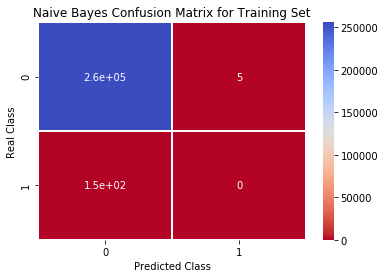

In [12]:
conf_matrix_bnb = confusion_matrix(Y_test, bnb_pred)
# Calculating recall from confusion matrix
recall_bnb = conf_matrix_bnb[1,1]/(conf_matrix_bnb[1,1]+conf_matrix_bnb[1,0])
print('Recall for the Naive Bayes model is: {}'.format(recall_bnb))

#creating heatmap of confusion matrix
sns.heatmap(conf_matrix_bnb, 
            cmap='coolwarm_r', 
            annot=True, 
            linewidths=0.5)
plt.title('Naive Bayes Confusion Matrix for Training Set')
plt.xlabel('Predicted Class')
plt.ylabel('Real Class')
plt.show()

In [13]:
# KNN Classifier
start = time.time()
knn_model = KNeighborsClassifier(n_neighbors=1, algorithm='ball_tree', n_jobs = 5)
knn_model.fit(X_train, Y_train)
knn_pred = knn_model.predict(X_test)
print ("Runtime %0.2f" % (time.time() - start))
evaluate('KNN',knn_pred)

Runtime 282.91


Recall for the KNN model is: 0.8243243243243243


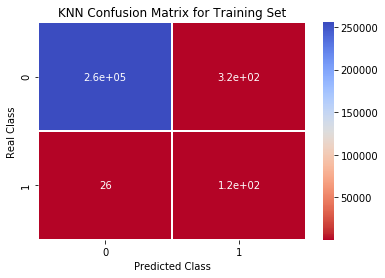

In [14]:
conf_matrix_knn = confusion_matrix(Y_test, knn_pred)
# Calculating recall from confusion matrix
recall_knn = conf_matrix_knn[1,1]/(conf_matrix_knn[1,1]+conf_matrix_knn[1,0])
print('Recall for the KNN model is: {}'.format(recall_knn))

#creating heatmap of confusion matrix
sns.heatmap(conf_matrix_knn, 
            cmap='coolwarm_r', 
            annot=True, 
            linewidths=0.5)
plt.title('KNN Confusion Matrix for Training Set')
plt.xlabel('Predicted Class')
plt.ylabel('Real Class')
plt.show()

In [15]:
# RandomForestClassifier 
start = time.time()
rfc = ensemble.RandomForestClassifier(n_jobs = 3)
rfc.fit(X_train, Y_train)
rfc_pred = rfc.predict(X_test)
print ("Runtime %0.2f" % (time.time() - start))
evaluate('Random Forest', rfc_pred)

Runtime 1.31


Recall for the Random Forest model is: 0.8108108108108109


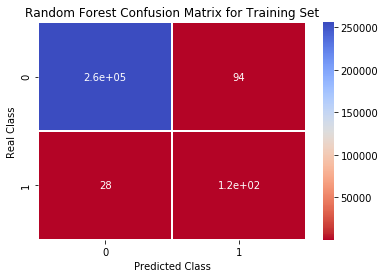

In [16]:
conf_matrix_rfc = confusion_matrix(Y_test, rfc_pred)
# Calculating recall from confusion matrix
recall_rfc = conf_matrix_rfc[1,1]/(conf_matrix_rfc[1,1]+conf_matrix_rfc[1,0])
print('Recall for the Random Forest model is: {}'.format(recall_rfc))

#creating heatmap of confusion matrix
sns.heatmap(conf_matrix_rfc, 
            cmap='coolwarm_r', 
            annot=True, 
            linewidths=0.5)
plt.title('Random Forest Confusion Matrix for Training Set')
plt.xlabel('Predicted Class')
plt.ylabel('Real Class')
plt.show()

In [17]:
# Logistic Regression
start = time.time()
log_reg_model = linear_model.LogisticRegression(penalty = 'l2', C=1e9)
log_reg_model.fit(X_train, Y_train)
log_reg_pred = log_reg_model.predict(X_test)
print ("Runtime %0.2f" % (time.time() - start))
evaluate('Logistic Regression', log_reg_pred)

Runtime 0.71


Recall for the Logistic Regression model is: 0.7635135135135135


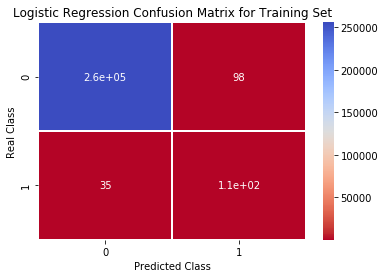

In [18]:
conf_matrix_log_reg = confusion_matrix(Y_test, log_reg_pred)
# Calculating recall from confusion matrix
recall_log_reg = conf_matrix_log_reg[1,1]/(conf_matrix_log_reg[1,1]+conf_matrix_log_reg[1,0])
print('Recall for the Logistic Regression model is: {}'.format(recall_log_reg))

#creating heatmap of confusion matrix
sns.heatmap(conf_matrix_log_reg, 
            cmap='coolwarm_r', 
            annot=True, 
            linewidths=0.5)
plt.title('Logistic Regression Confusion Matrix for Training Set')
plt.xlabel('Predicted Class')
plt.ylabel('Real Class')
plt.show()

In [19]:
# Ridge Classifier
start = time.time()
ridge_model = linear_model.RidgeClassifier(alpha = 1e-4)
ridge_model.fit(X_train, Y_train)
ridge_pred = ridge_model.predict(X_test)
print ("Runtime %0.2f" % (time.time() - start))
evaluate('Ridge Regression', ridge_pred)

Runtime 0.43


Recall for the Ridge Regressin model is: 0.5472972972972973


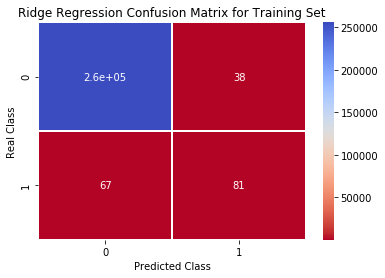

In [20]:
conf_matrix_ridge = confusion_matrix(Y_test, ridge_pred)
# Calculating recall from confusion matrix
recall_ridge = conf_matrix_ridge[1,1]/(conf_matrix_ridge[1,1]+conf_matrix_ridge[1,0])
print('Recall for the Ridge Regressin model is: {}'.format(recall_ridge))

#creating heatmap of confusion matrix
sns.heatmap(conf_matrix_ridge, 
            cmap='coolwarm_r', 
            annot=True, 
            linewidths=0.5)
plt.title('Ridge Regression Confusion Matrix for Training Set')
plt.xlabel('Predicted Class')
plt.ylabel('Real Class')
plt.show()

In [21]:
# Lasso Classifier
start = time.time()
lasso_model = linear_model.LogisticRegression(penalty = 'l1')
lasso_model.fit(X_train, Y_train)
lasso_pred = lasso_model.predict(X_test)
print ("Runtime %0.2f" % (time.time() - start))
evaluate('Lasso Regression', lasso_pred)

Runtime 4.46


Recall for the Lasso Regression model is: 0.75


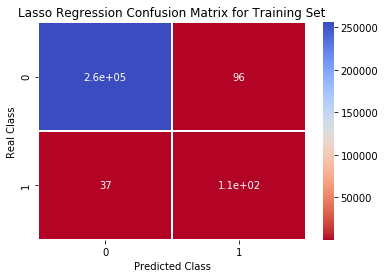

In [22]:
conf_matrix_lasso = confusion_matrix(Y_test, lasso_pred)
# Calculating recall from confusion matrix
recall_lasso = conf_matrix_lasso[1,1]/(conf_matrix_lasso[1,1]+conf_matrix_lasso[1,0])
print('Recall for the Lasso Regression model is: {}'.format(recall_lasso))

#creating heatmap of confusion matrix
sns.heatmap(conf_matrix_lasso, 
            cmap='coolwarm_r', 
            annot=True, 
            linewidths=0.5)
plt.title('Lasso Regression Confusion Matrix for Training Set')
plt.xlabel('Predicted Class')
plt.ylabel('Real Class')
plt.show()

In [23]:
# SVClassifier
start = time.time()
svc_model = svm.SVC(C = 100, kernel = 'rbf')
svc_model.fit(X_train, Y_train)
svc_pred = svc_model.predict(X_test)
print ("Runtime %0.2f" % (time.time() - start))
evaluate('SVM', svc_pred)

Runtime 6.53


Recall for the SVC model is: 0.8040540540540541


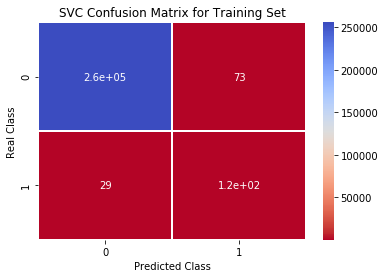

In [24]:
conf_matrix_svc = confusion_matrix(Y_test, svc_pred)
# Calculating recall from confusion matrix
recall_svc = conf_matrix_svc[1,1]/(conf_matrix_svc[1,1]+conf_matrix_svc[1,0])
print('Recall for the SVC model is: {}'.format(recall_svc))

#creating heatmap of confusion matrix
sns.heatmap(conf_matrix_svc, 
            cmap='coolwarm_r', 
            annot=True, 
            linewidths=0.5)
plt.title('SVC Confusion Matrix for Training Set')
plt.xlabel('Predicted Class')
plt.ylabel('Real Class')
plt.show()

In [25]:
# Gradient Boost Classifier
start = time.time()
params = {'n_estimators': 1000,
          'max_depth': 2,
          'learning_rate': 0.001,
          'loss': 'deviance'}
gbc = ensemble.GradientBoostingClassifier(**params)
gbc.fit(X_train, Y_train)
gbc_pred = gbc.predict(X_test)
print ("Runtime %0.2f" % (time.time() - start))
evaluate('Gradient Boost', gbc_pred)

Runtime 76.55


Recall for the Gradient Boost Classifier model is: 0.8040540540540541


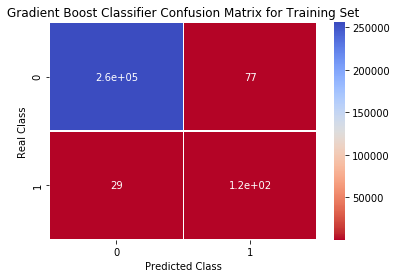

In [26]:
conf_matrix_gbc = confusion_matrix(Y_test, gbc_pred)
# Calculating recall from confusion matrix
recall_lasso = conf_matrix_gbc[1,1]/(conf_matrix_gbc[1,1]+conf_matrix_gbc[1,0])
print('Recall for the Gradient Boost Classifier model is: {}'.format(recall_lasso))

#creating heatmap of confusion matrix
sns.heatmap(conf_matrix_gbc, 
            cmap='coolwarm_r', 
            annot=True, 
            linewidths=0.5)
plt.title('Gradient Boost Classifier Confusion Matrix for Training Set')
plt.xlabel('Predicted Class')
plt.ylabel('Real Class')
plt.show()

In [27]:
df_eval.rename(index={0: 'Accuracy', 
                      1: 'AUC Score', 
                      2: 'Recall'
                     }, inplace = True)

## Evaluation

In [28]:
from sklearn.model_selection import cross_val_score

print('Naive Bayes cross validation score: ', cross_val_score(bnb, X_train, Y_train, cv=5))
print('KNN cross validation score: ', cross_val_score(knn_model, X_train, Y_train, cv=5))
print('Logistic Regression cross validation score: ', cross_val_score(log_reg_model, X_train, Y_train, cv=5))
print('Random Forest Classification cross validation score: ', cross_val_score(rfc, X_train, Y_train, cv=5))
print('Ridge Regression cross validation score: ', cross_val_score(ridge_model, X_train, Y_train, cv=5))
print('Lasso Regression cross validation score: ', cross_val_score(lasso_model, X_train, Y_train, cv=5))
print('SVC cross validation score: ', cross_val_score(svc_model, X_train, Y_train, cv=5))
print('Gradient Boost Classifier cross validation score: ', cross_val_score(gbc, X_train, Y_train, cv=5))


Naive Bayes cross validation score:  [ 0.98818624  0.98801043  0.98801043  0.98801043  0.98835593]
KNN cross validation score:  [ 0.99722029  0.99652476  0.99652476  0.99721981  0.99635036]
Logistic Regression cross validation score:  [ 0.99826268  0.99756733  0.99704605  0.99774109  0.99600278]
Random Forest Classification cross validation score:  [ 0.99826268  0.99791486  0.99721981  0.99843614  0.99652416]
Ridge Regression cross validation score:  [ 0.99461432  0.99565595  0.99443962  0.99426586  0.99391727]
Lasso Regression cross validation score:  [ 0.99739402  0.99739357  0.99687228  0.99652476  0.9956552 ]
SVC cross validation score:  [ 0.99826268  0.99808862  0.99687228  0.99756733  0.99582899]
Gradient Boost Classifier cross validation score:  [ 0.9966991   0.99739357  0.99669852  0.99791486  0.99600278]


In [29]:
# Accuracy scores, highlight highest in each row
df_eval.style.highlight_max(axis = 1)

,Baseline,Naive Bayes,KNN,Random Forest,Logistic Regression,Ridge Regression,Lasso Regression,SVM,Gradient Boost
Accuracy,0.999418,0.999402,0.998664,0.999523,0.999481,0.99959,0.999481,0.999602,0.999586
AUC Score,0,0,0.824324,0.810811,0.763514,0.547297,0.75,0.804054,0.804054
Recall,0.499998,0.49999,0.911545,0.905222,0.881565,0.773574,0.874812,0.901884,0.901877


In [30]:
from sklearn.metrics import f1_score

#printing F1 scores for reach model's predicted values
print('F1 score for Baseline: {}'. format(f1_score(Y_test, base_pred)))
print('F1 score for Naives Bayes: {}'. format(f1_score(Y_test, bnb_pred)))
print('F1 score for KNN: {}'. format(f1_score(Y_test, knn_pred)))
print('F1 score for Random Forest Classification: {}'. format(f1_score(Y_test, rfc_pred)))
print('F1 score for Logistic Regression: {}'.format(f1_score(Y_test, log_reg_pred)))
print('F1 score for Ridge Regression: {}'.format(f1_score(Y_test, ridge_pred)))
print('F1 score for Lasso Regression: {}'.format(f1_score(Y_test, lasso_pred)))
print('F1 score for SVC Classification: {}'. format(f1_score(Y_test, svc_pred)))
print('F1 score for Gradient Boost: {}'. format(f1_score(Y_test, gbc_pred)))

F1 score for Baseline: 0.0
F1 score for Naives Bayes: 0.0
F1 score for KNN: 0.416382252559727
F1 score for Random Forest Classification: 0.6629834254143646
F1 score for Logistic Regression: 0.6295264623955431
F1 score for Ridge Regression: 0.6067415730337079
F1 score for Lasso Regression: 0.6253521126760563
F1 score for SVC Classification: 0.7
F1 score for Gradient Boost: 0.6918604651162791


## write-up

The aim of this challenge is to build a model that correctly finds fraud. I divided my analysis in three steps:

- Data exploration
- Model building
- Evaluation

In the data exploration phase I normalized the data, and carried out a statistical test determining the t-value and p-value for each column. From the description of the p-values we can determine that there is a real significance between the non-fraudulent and fraudulent group means. We plotted a histogram representing values of these two groups from one particular column (V10) revealing that the fraudulent cases in this dataset are much more common than the non-fraudulent.

We later carried out training of eight different prediction models, which were: Naive Bayes, KNN, Random Forest, Logistic Regression, Ridge Regression, SVM and Gradient Boost. In this phase we also constructed the recall value which is  is the fraction of relevant instances that have been retrieved over the total amount of relevant instances for each model, and confusion matrix to visualize their results.

In the evaluation process we computed cross validation scores for each model, which lead us to determine that each of the models had a great accuracy. We also calculated the area under the receiver operating characteristic curve (AUC), that is the probability that a randomly chosen positive example ranks above a randomly chosen negative example, which helped us decide which model has a better classification accuracy.

Evaluating the metrics of the different models we used, we can come to the conlusion that the __Random Forest__ model prioritizes correctly finding fraud.